# Image Analysis in python


## Setup

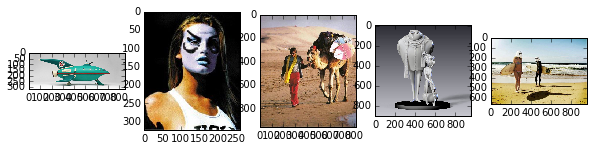

In [1]:
# Bring in necessary libraries
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from skimage import color
import skimage.filters as filters
import skimage.exposure as exposure
import skimage.feature as feature
from skimage.transform import hough_circle
from skimage.feature import peak_local_max
from skimage import morphology
from skimage.draw import circle_perimeter
from skimage import img_as_float, img_as_ubyte, img_as_uint
from skimage import segmentation as seg
from skimage.morphology import watershed
from skimage.morphology import disk
from scipy import ndimage as nd
from scipy.ndimage import convolve
import glob # for bulk file import

# Set defaults
plt.rcParams['image.cmap'] = 'gray' # Display grayscale images in... grayscale.
plt.rcParams['image.interpolation'] = 'none' # Use nearest-neighbour
plt.rcParams['figure.figsize'] = 10, 10

# Import test images
imgpaths = glob.glob("./images/*.jpg") + glob.glob("./images/*.png")
imgset = [img_as_ubyte(mpimg.imread(x)) for x in imgpaths]

# Display thumbnails of the images to ensure loading
plt.figure()
for i,img in enumerate(imgset):
    plt.subplot(1, len(imgset), i+1)
    plt.imshow(img, cmap = 'gray')

## Color and Exposure

### Histograms and color channels

In [2]:
# Plots a histogram of the image, splitting into individual channels if necessary.
def plot_multichannel_histo(img):
    if img.ndim == 2: # plot grayscale histo
        plt.hist(img.flatten(), 256,  range=(0,255), color='k', histtype='step')
    elif img.ndim == 3: # print rgb histo
        plt.hist(img.reshape(-1,3), 256,  range=(0,255), color=['r','g','b'],histtype='step')
    else: # Not an image
        print("Must pass a valid RGB or grayscale image")
    plt.xlim([0,255])

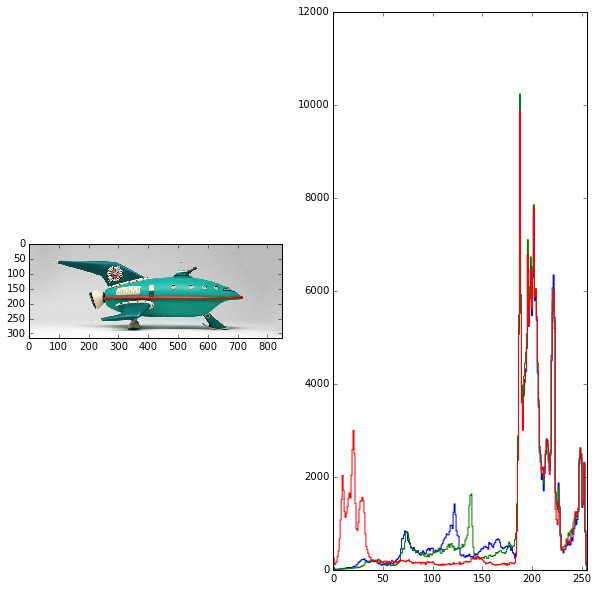

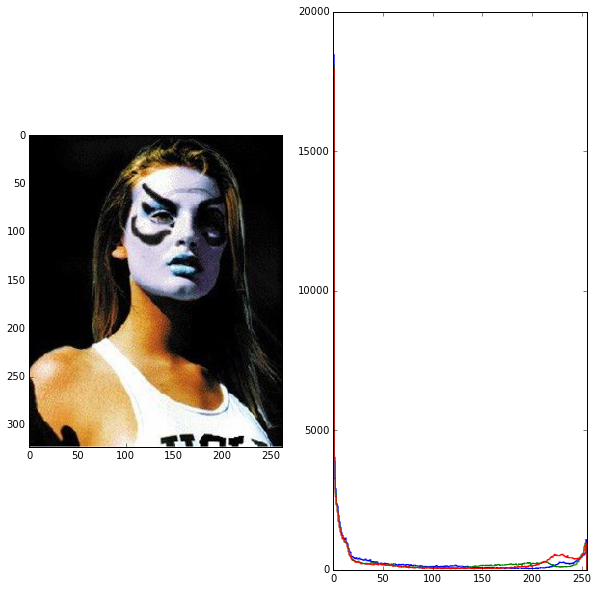

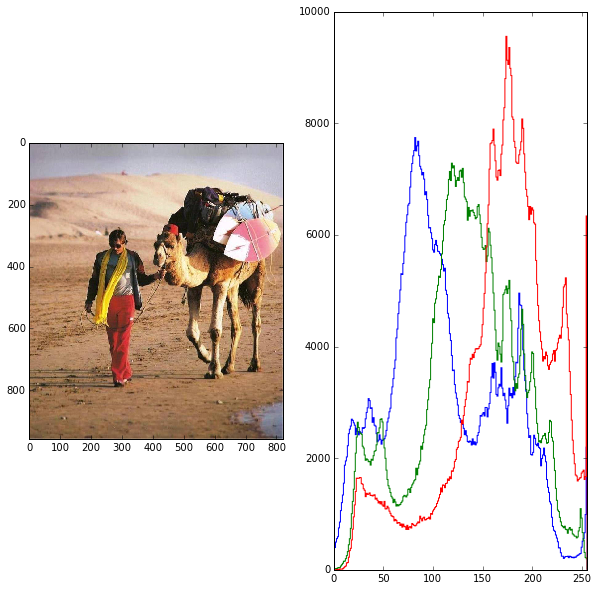

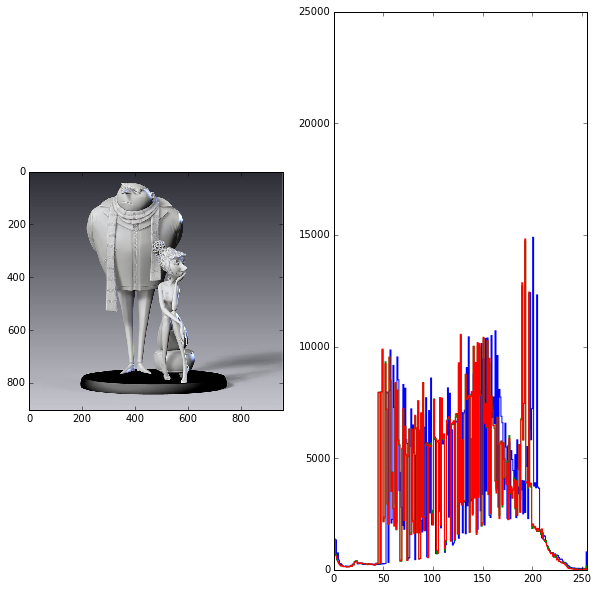

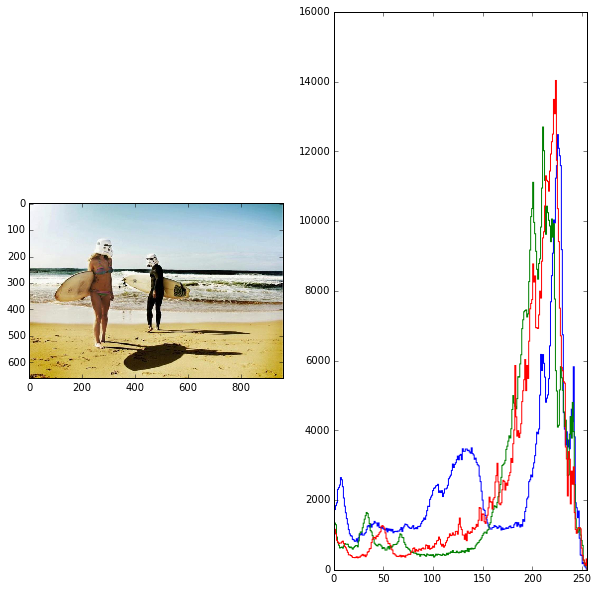

In [3]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.subplot(1, 2, 2)
    plot_multichannel_histo(img)

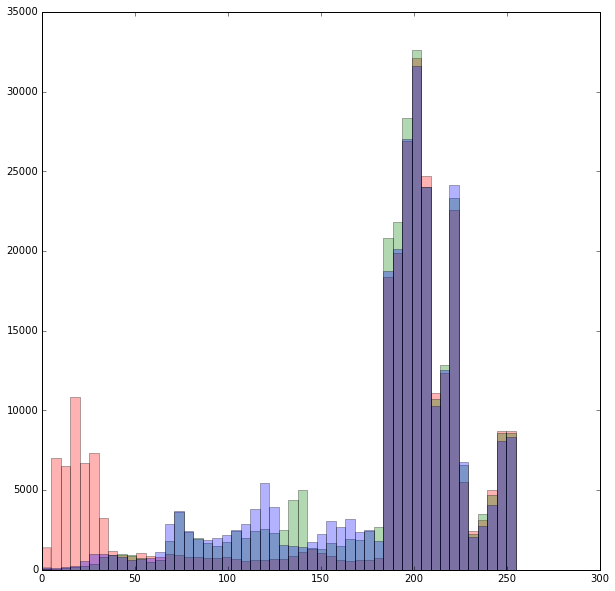

In [4]:
# Alternate histogram syntax
for col, channel in zip('rgb',np.rollaxis(imgset[0],axis=-1)):
    plt.hist(channel.flatten(), bins=50, color=col,alpha=0.3)

### Thresholding Images 

In [5]:
# Plot a per-channel thresholded image and its corresponding histogram
def plot_threshold_with_histo(img, thresh):
    plt.subplot(1, 2, 1)
    plt.imshow(img > thresh)
    plt.subplot(1, 2, 2)
    plot_multichannel_histo(img)
    plt.axvline(thresh, color='red');

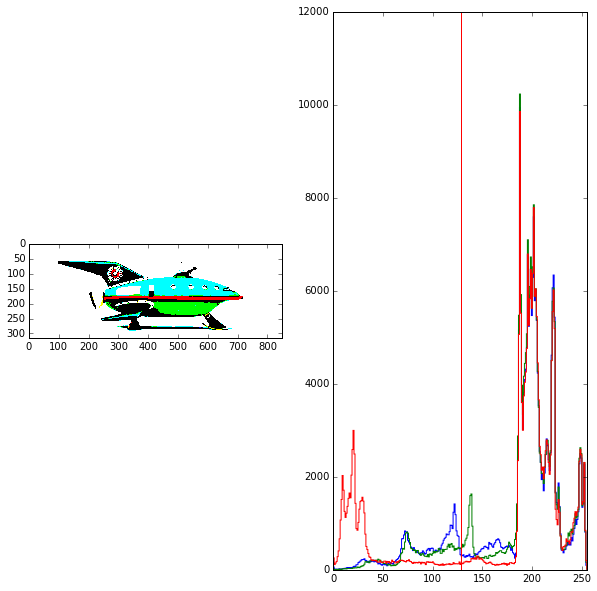

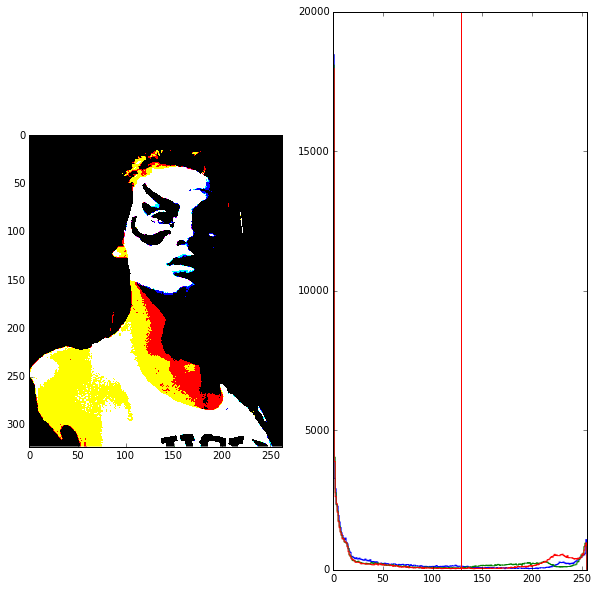

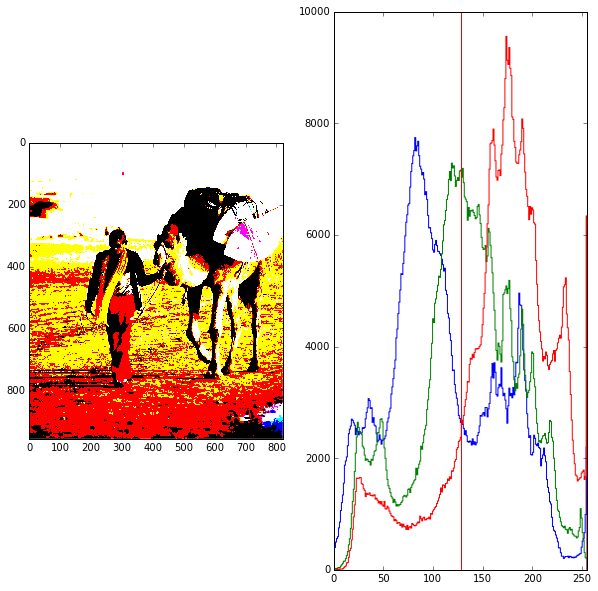

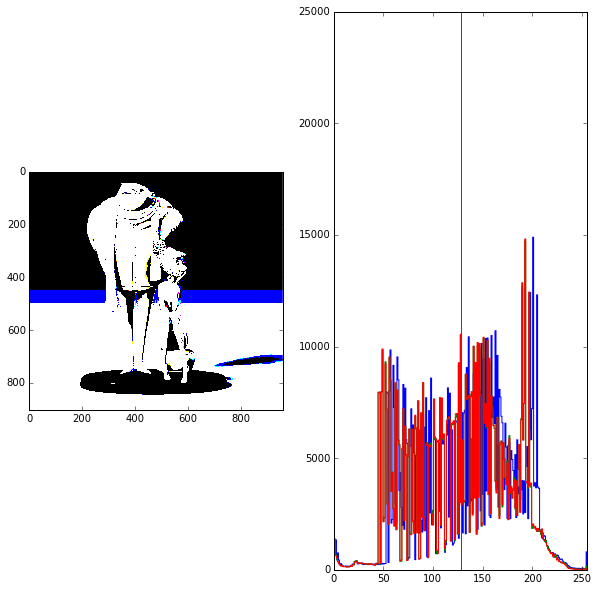

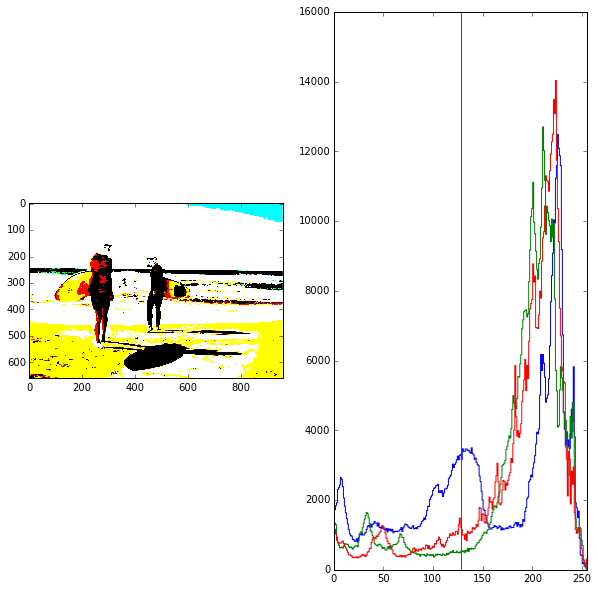

In [6]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plot_threshold_with_histo(img, 128)

### Sepia and color filters

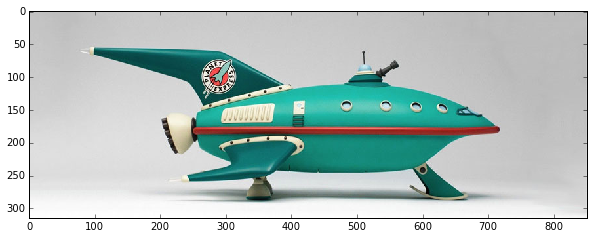

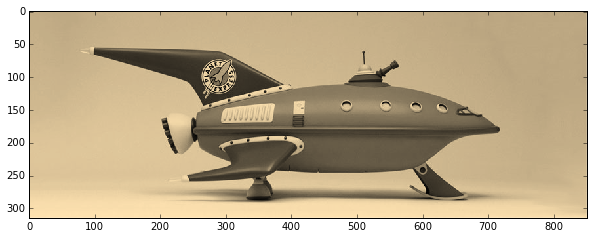

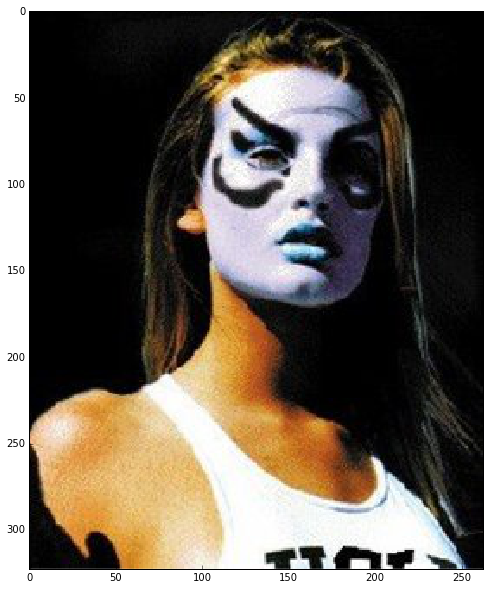

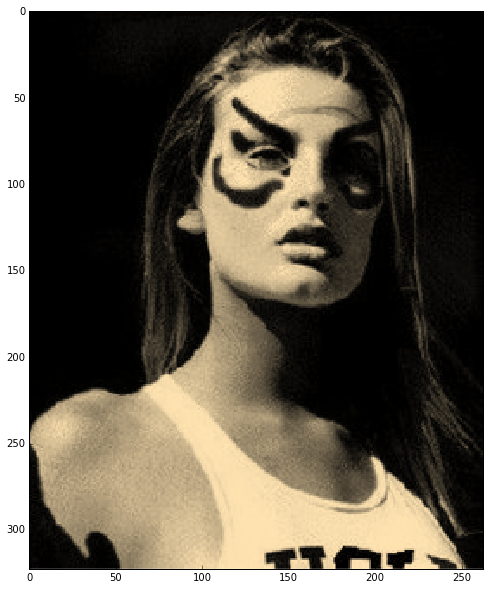

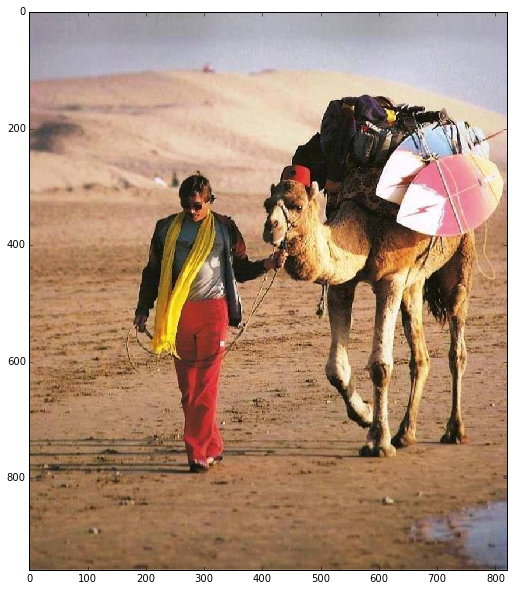

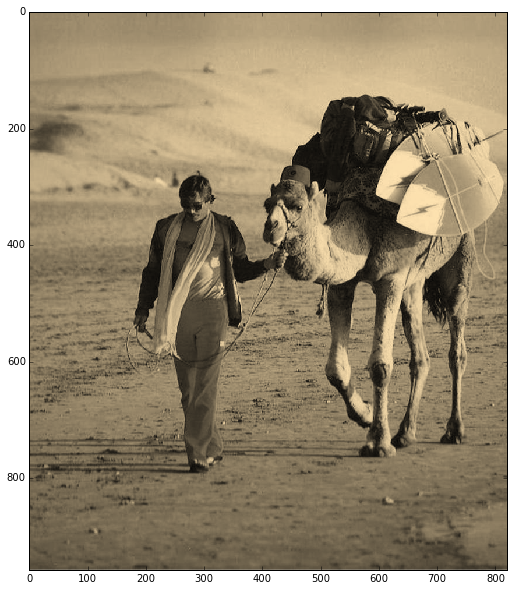

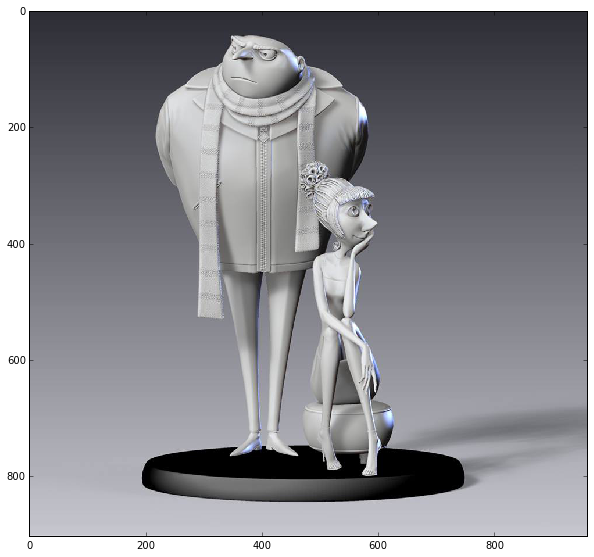

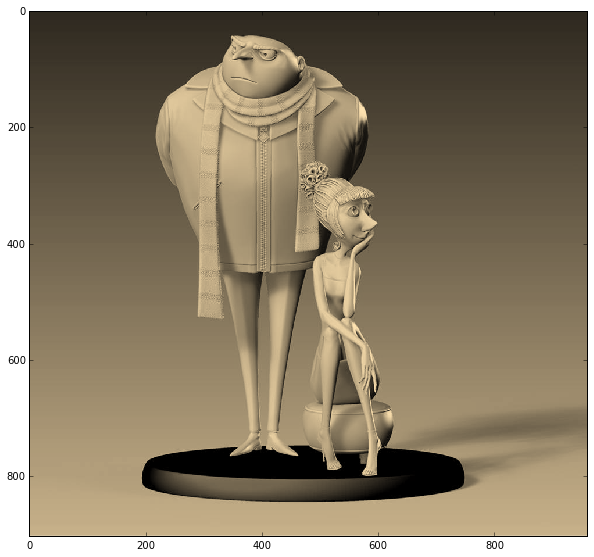

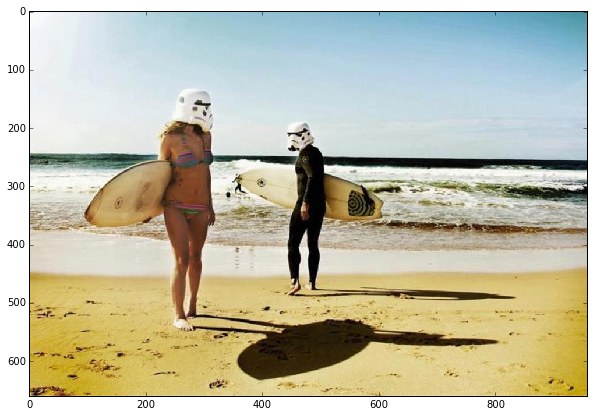

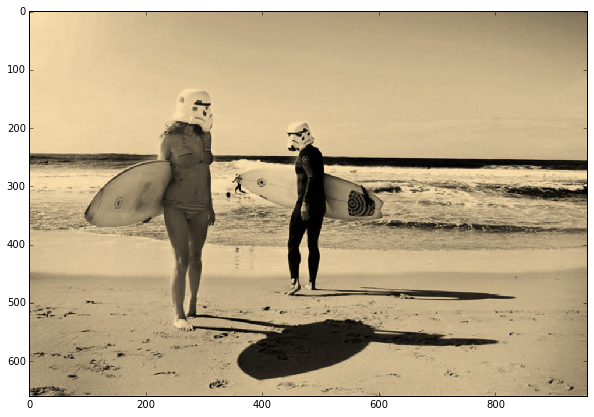

In [7]:
# Sepia and color filters
def sepia_filter(img):
  #create a kernel which will be used to the original image.
  sepia_filter = np.array([[.393, .769, .189],
                           [.349, .686, .168],
                           [.272, .534, .131]])
  #Dot product the image and array
  #T is the transpose of the array.
  sepia_img = img.dot(sepia_filter.T)

  #Since our filter lines do not have unit sum, so we need to rescale
  sepia_img /= sepia_img.max()
  return sepia_img

for i,img in enumerate(imgset):
    sepia = sepia_filter(img)
    plt.imshow(img)
    plt.show()
    plt.imshow(sepia)
    plt.show()    


### Enhance Contrast

C:\Anaconda\lib\site-packages\skimage\util\dtype.py:111: UserWarning: Possible precision loss when converting from float64 to uint8
  "%s to %s" % (dtypeobj_in, dtypeobj))


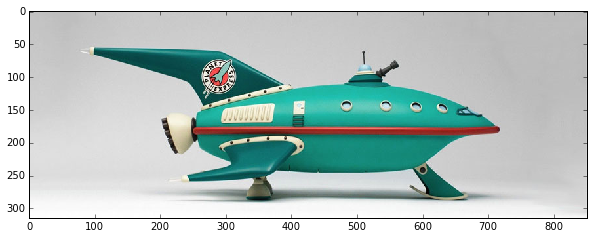

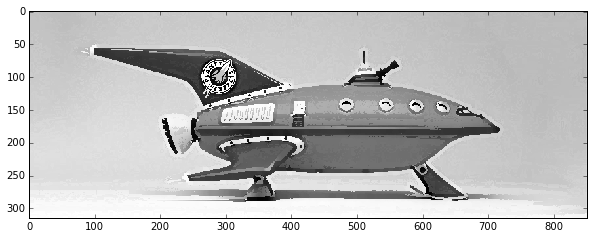

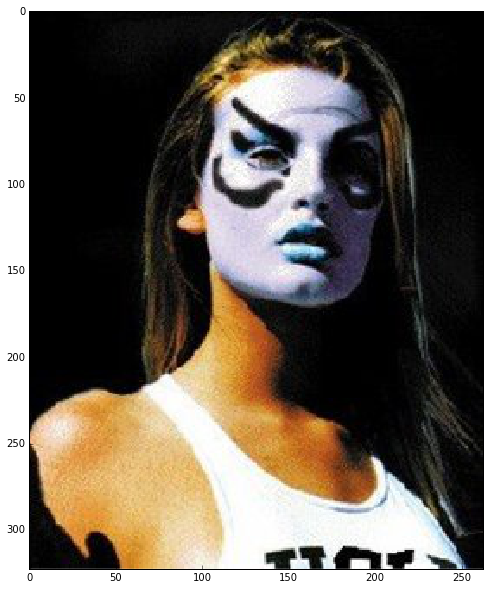

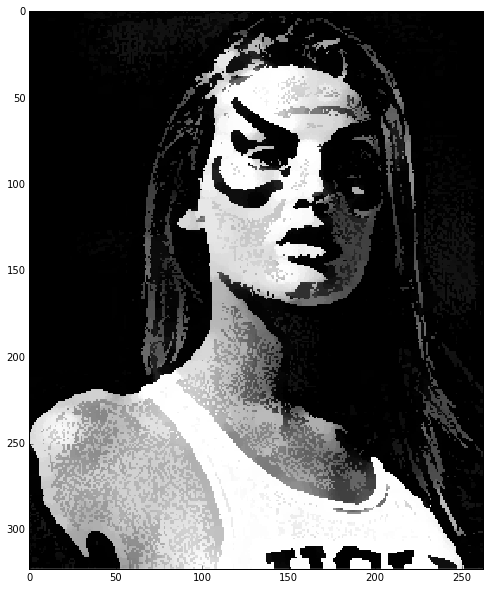

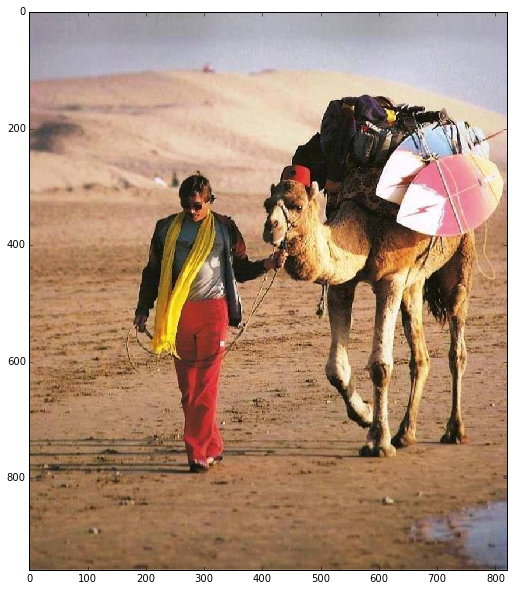

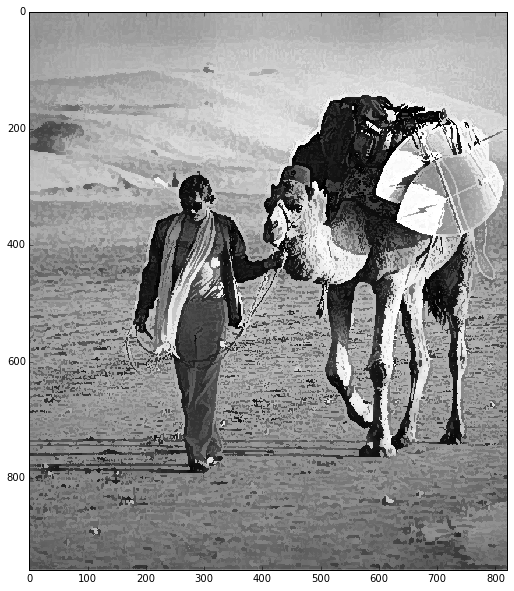

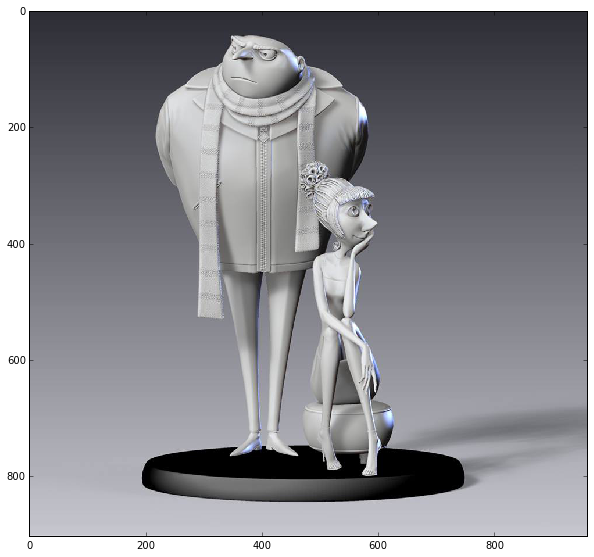

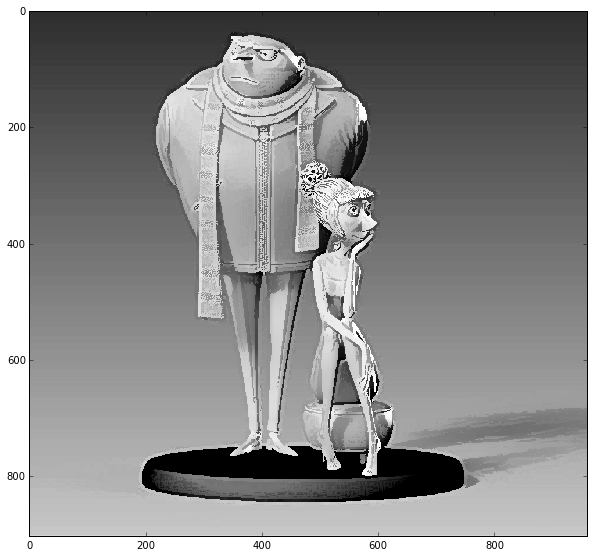

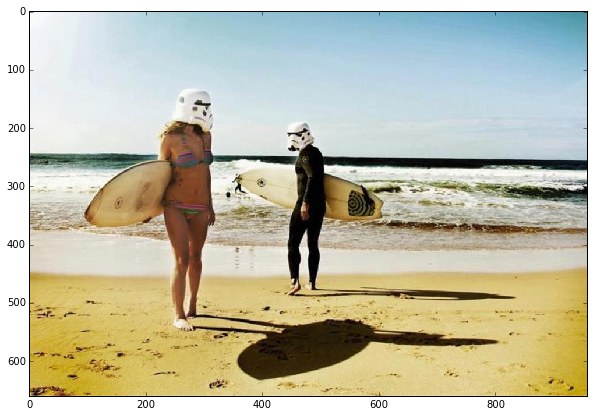

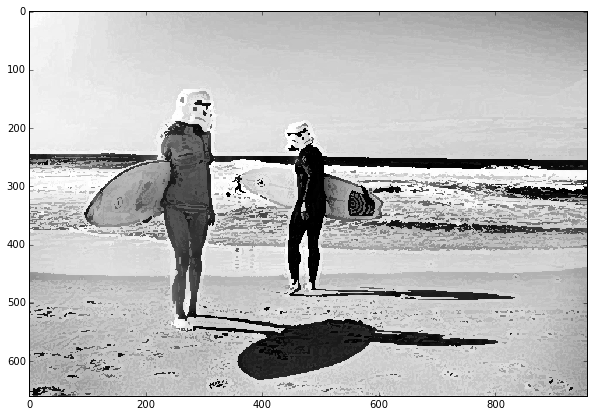

In [8]:
# Enhance Contrast
def boost_contrast(img):
    if img.ndim == 3:
        img = color.rgb2grey(img) 
    ent = filters.rank.enhance_contrast(img_as_ubyte(img), disk(5))
    return ent

for i,img in enumerate(imgset):
    new = boost_contrast(img)
    plt.imshow(img)
    plt.show()
    plt.imshow(new)
    plt.show()  

### Add entropy

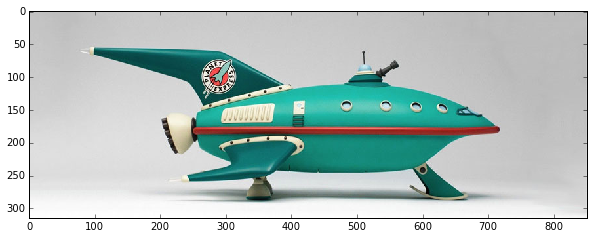

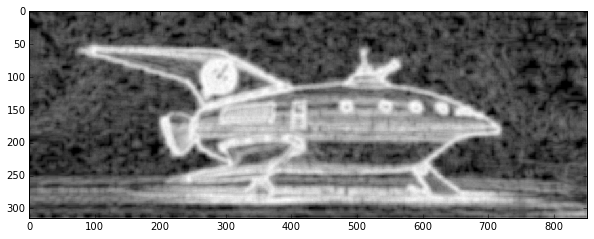

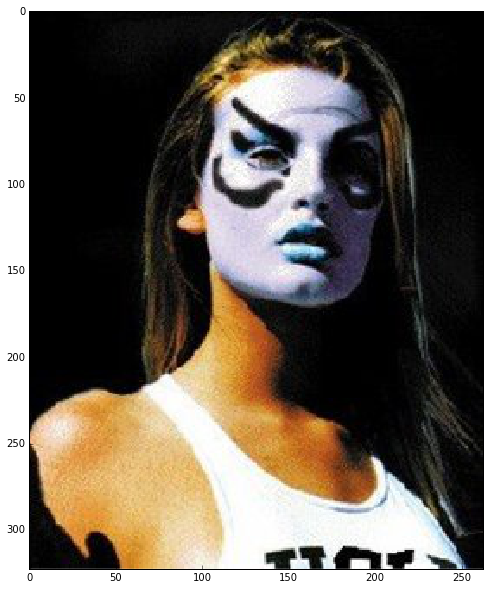

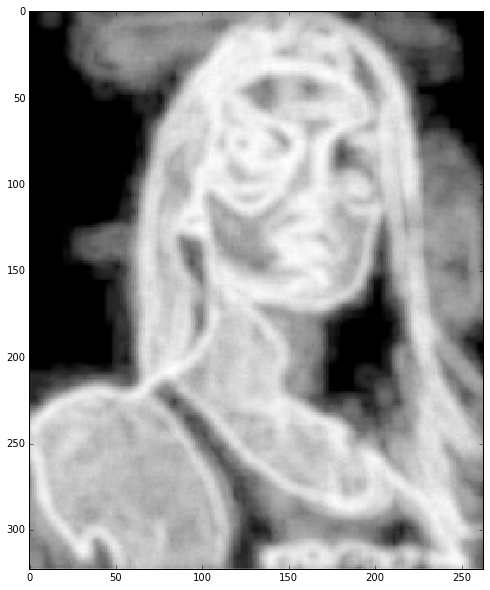

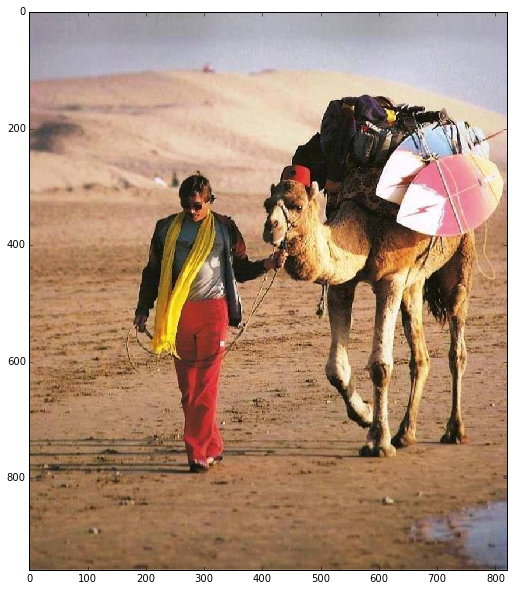

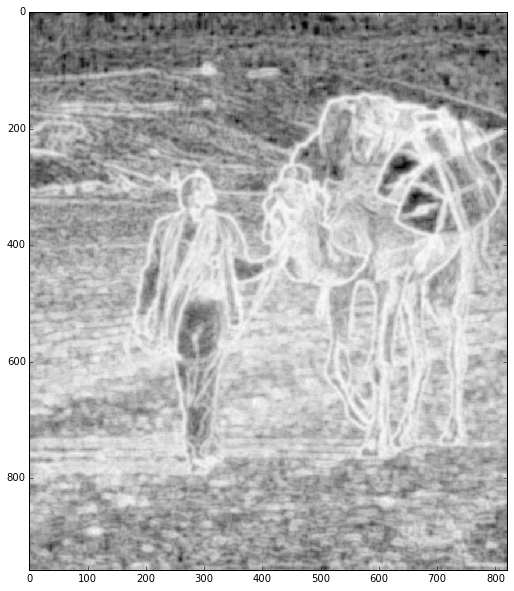

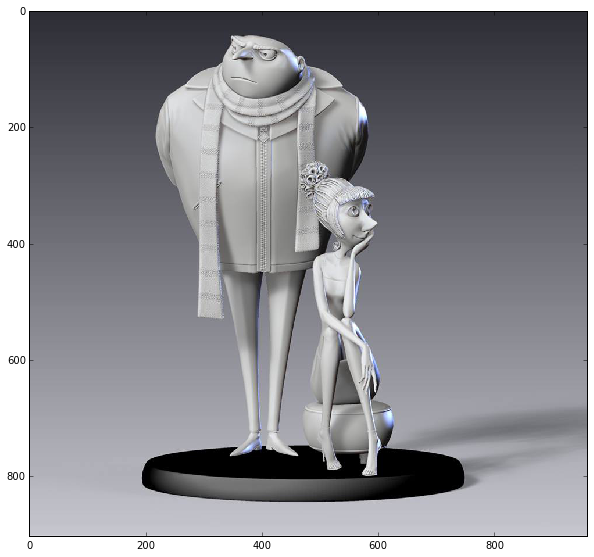

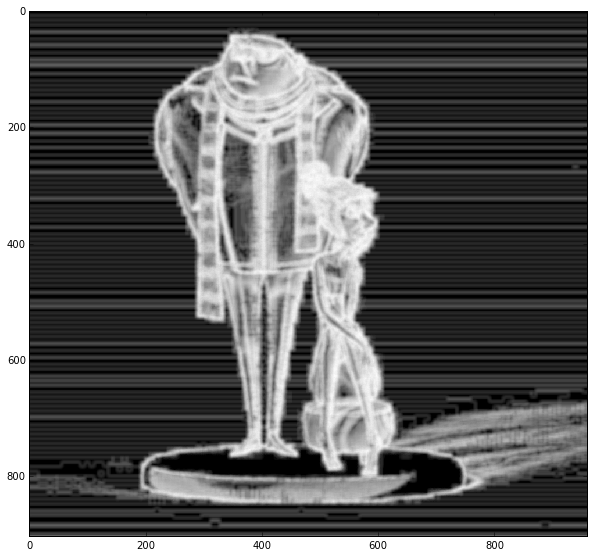

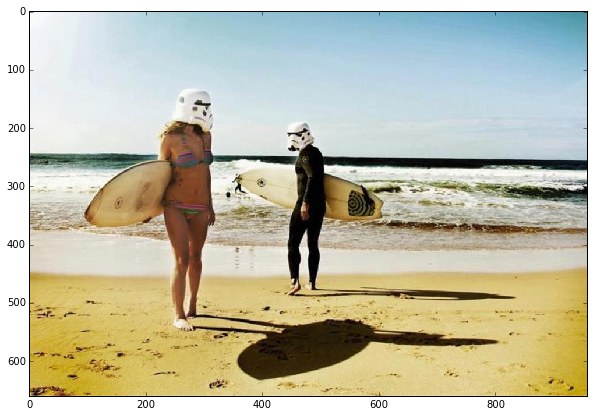

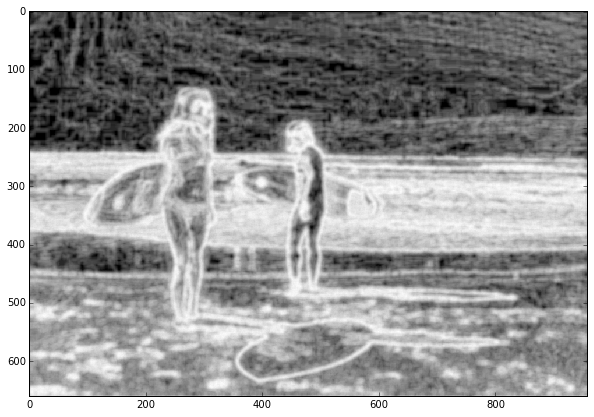

In [9]:
# Add entropy
def add_entropy(img):
    if img.ndim == 3:
        img = color.rgb2grey(img) 
    ent = filters.rank.entropy(img_as_ubyte(img), disk(5))
    return ent

for i,img in enumerate(imgset):
    new = add_entropy(img)
    plt.imshow(img)
    plt.show()
    plt.imshow(new)
    plt.show()  

### H, S and V color space

In [10]:
# Show HSV as three plots
def plot_hsv_components(img):
    if img.ndim == 2: # convert grayscale to rgb
        hsv = color.rgb2hsv(color.gray2rgb(img))
    elif img.ndim == 3:
        hsv = color.rgb2hsv(img)
    else: # Not an image
        print("Must pass a valid RGB or grayscale image")
    plt.subplot(1, 3, 1)
    plt.title('Hue')
    plt.imshow(hsv[:,:,0], cmap='hsv') # Hue
    plt.subplot(1, 3, 2)
    plt.title('Saturation')
    plt.imshow(hsv[:,:,1], cmap='Greens') # Sat
    plt.subplot(1, 3, 3)
    plt.title('Value')
    plt.imshow(hsv[:,:,2], cmap='gray') # Value

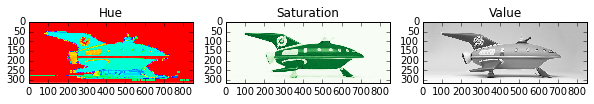

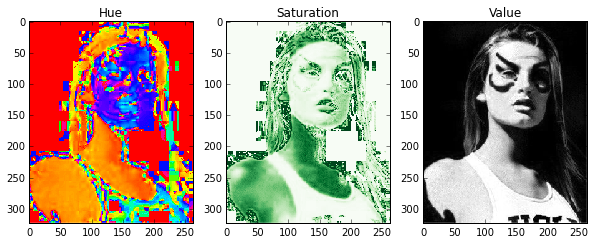

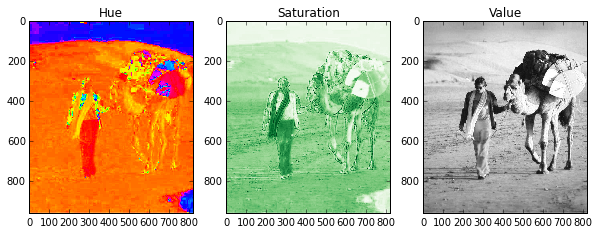

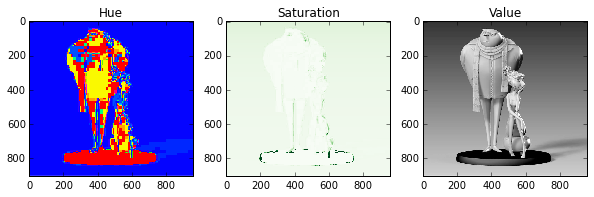

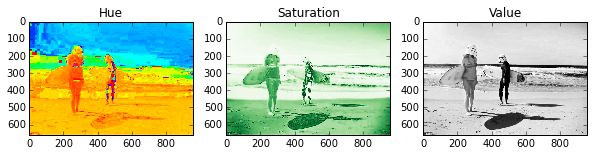

In [11]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plot_hsv_components(img)

### CIELAB color space. L, a, b channels

In [12]:
# Show Lab as three plots
def plot_Lab_components(img):
    if img.ndim == 2: # convert grayscale to Lab
        lab = color.rgb2lab(color.gray2rgb(img))
    elif img.ndim == 3:
        lab = color.rgb2lab(img)
    else: # Not an image
        print("Must pass a valid RGB or grayscale image")
    plt.subplot(1, 3, 1)
    plt.title('L')
    plt.imshow(lab[:,:,0]) # L
    plt.subplot(1, 3, 2)
    plt.title('a')
    plt.imshow(lab[:,:,1]) # a
    plt.subplot(1, 3, 3)
    plt.title('b')
    plt.imshow(lab[:,:,2]) # b

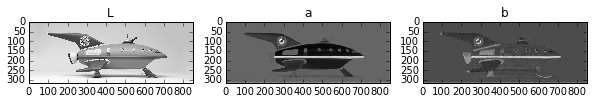

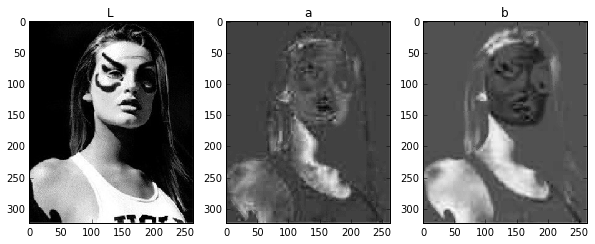

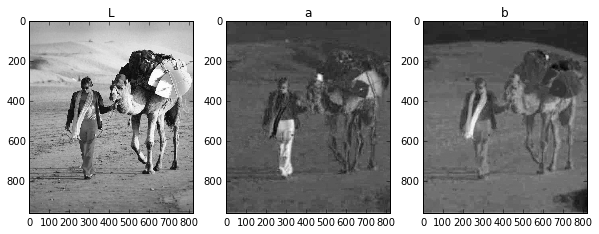

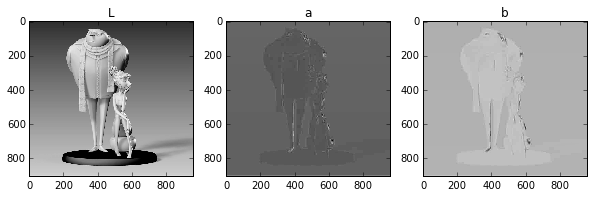

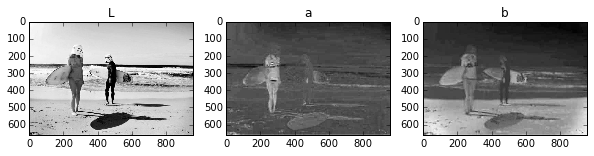

In [13]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plot_Lab_components(img)

# Image Filters - Convolution of kernels

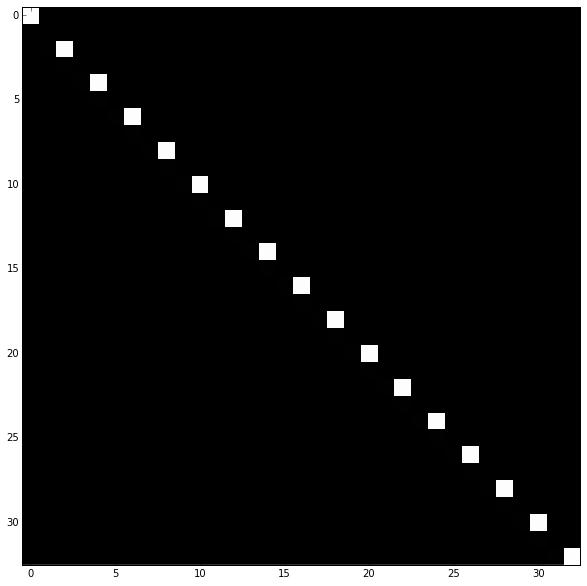

In [14]:
# Create some arbitrary kernel
def generate_kernel(size):
    kernel = np.zeros((size,size))
    for x in range(size):
        if x%2==0:
          kernel[x][x] = 1.0    
    kernel = kernel / float(sum(sum(kernel)))
    return kernel

kernel = generate_kernel(33)
plt.imshow(kernel)

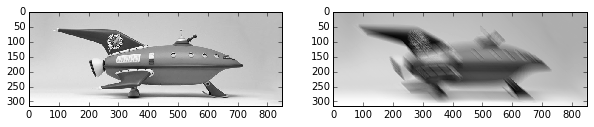

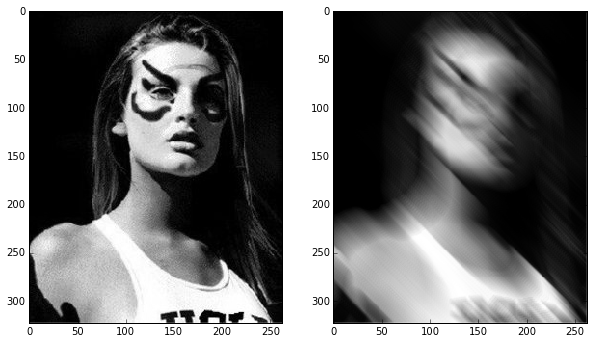

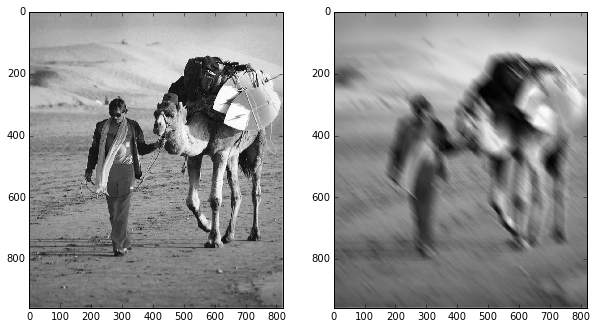

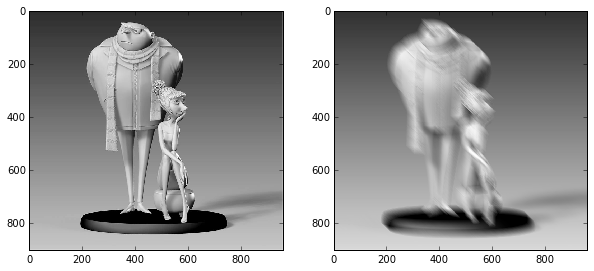

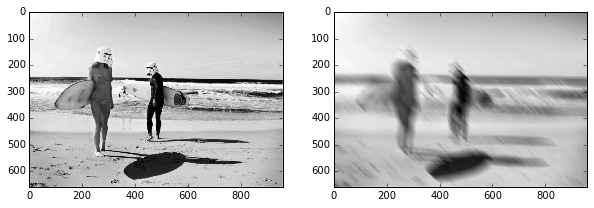

In [15]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = color.rgb2grey(img)
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(convolve(imgbw, kernel))

## Downsampling

In [16]:
# Downsample an image by skipping indicies
def decimate_image(img, skip):
     return img[::skip,::skip]

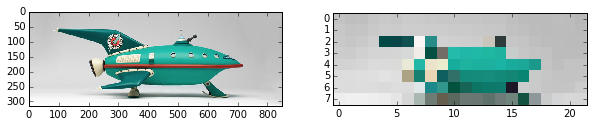

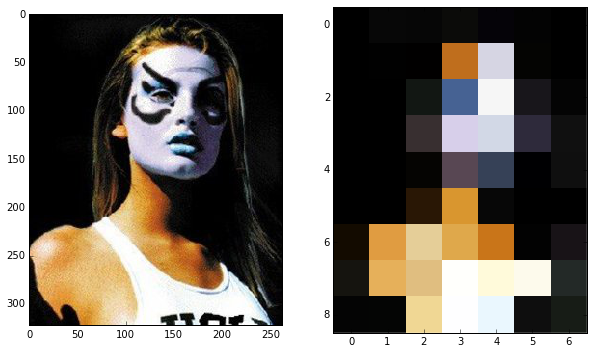

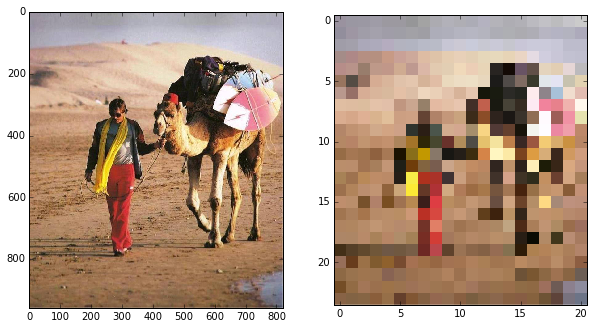

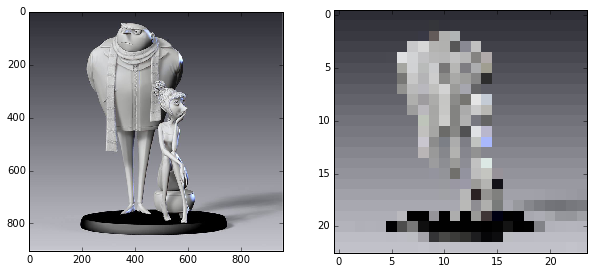

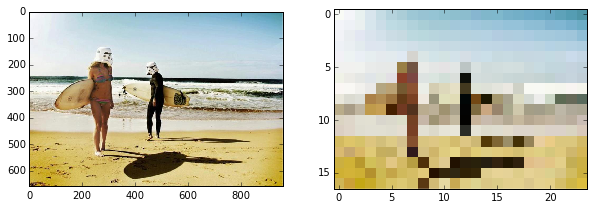

In [17]:
# Apply to image set
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(decimate_image(img, 40))

## Gaussian filters

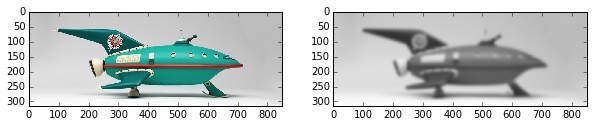

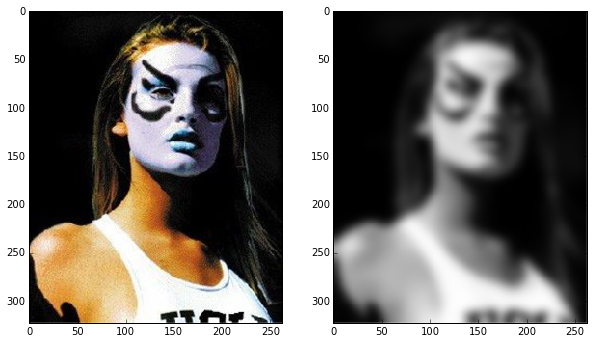

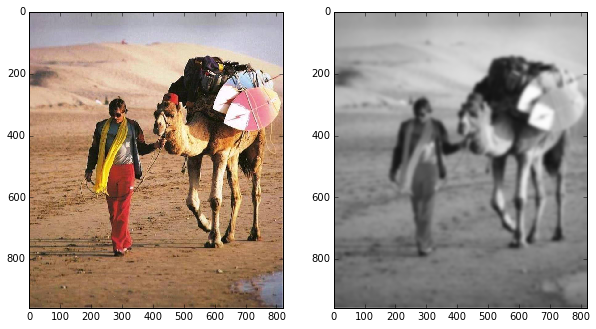

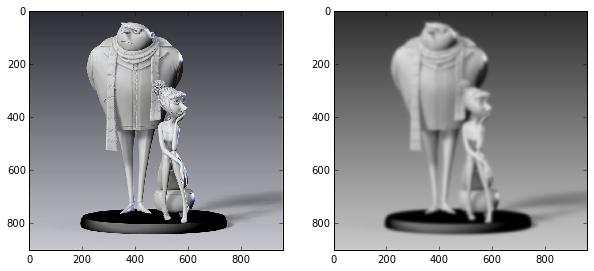

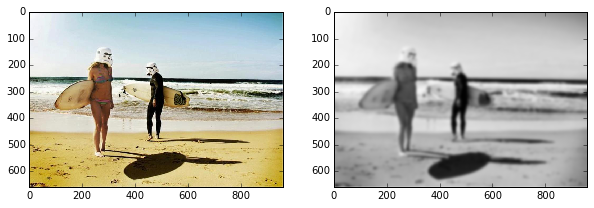

In [18]:
# Apply to image set
sigma = 5.0
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(filters.gaussian_filter(img, sigma,mode='reflect', multichannel=False))

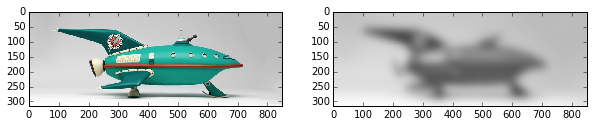

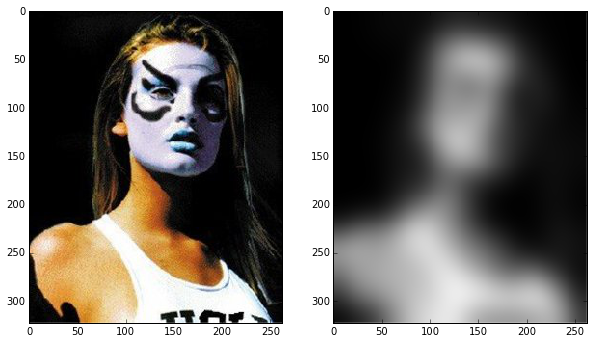

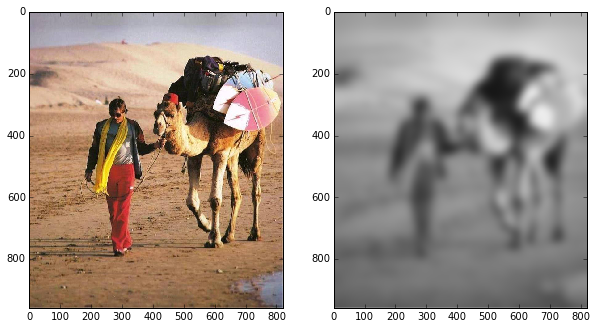

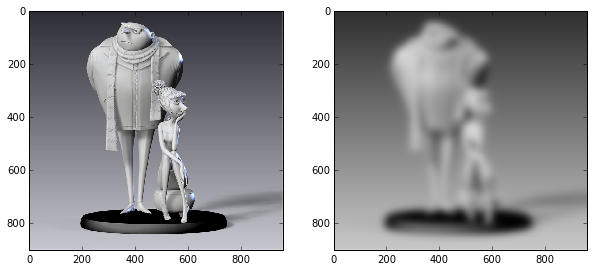

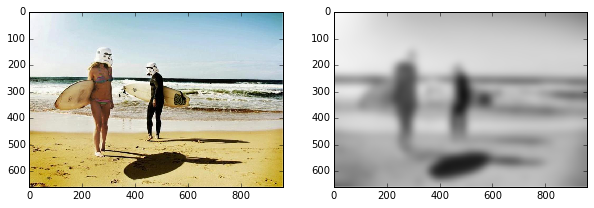

In [19]:
# Apply to image set
sigma = 15.0
for i,img in enumerate(imgset):
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(filters.gaussian_filter(img, sigma,mode='reflect', multichannel=False))

## Spatial difference filters

In [20]:
# Find horizontal edges using a simple shifting method
def find_horizontal_edges(img):
    imgbw = img_as_float(color.rgb2grey(img))
    return np.abs(imgbw[:, 1:] - imgbw[:, :-1])

# Find vertical edges using a simple shifting method
def find_vertical_edges(img):
    imgbw = img_as_float(color.rgb2grey(img))
    return np.abs(imgbw[1:, :] - imgbw[:-1, :])

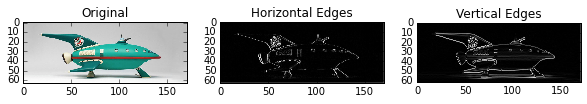

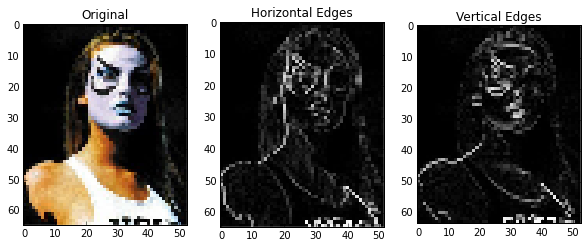

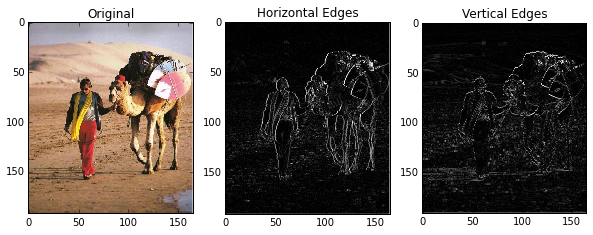

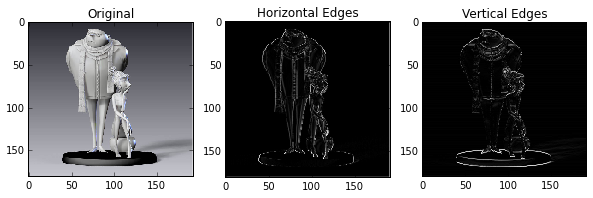

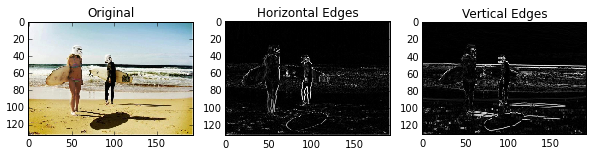

In [21]:
# Apply to image set
for i,img in enumerate(imgset):
    decimg = decimate_image(img, 5) # downsample to make it easier to see graphs
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.title('Original')
    plt.imshow(decimg)
    plt.subplot(1, 3, 2)
    plt.title('Horizontal Edges')
    plt.imshow(find_horizontal_edges(decimg))
    plt.subplot(1, 3, 3)
    plt.title('Vertical Edges')
    plt.imshow(find_vertical_edges(decimg))

## Difference filter pair-wise differences

In [22]:
# Find the absolute difference between two images. Crops to the shared region between images.
def find_pairwise_difference(img_a, img_b):
    subset = np.minimum(img_a.shape, img_b.shape)
    img_a_subset = img_a[:subset[0], :subset[1]]
    img_b_subset = img_b[:subset[0], :subset[1]]
    return img_a_subset, img_b_subset, np.abs(img_a_subset - img_b_subset)

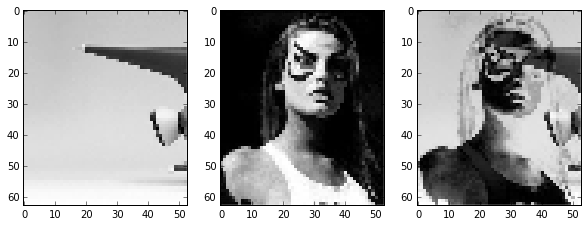

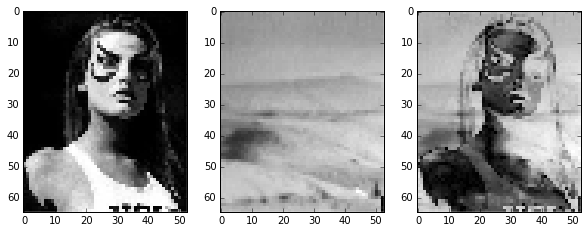

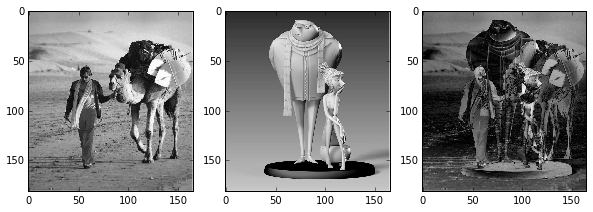

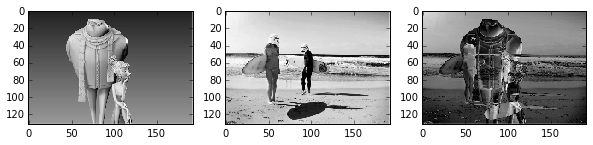

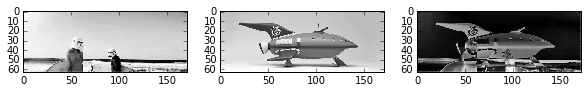

In [23]:
# Apply to image set
for i in range(len(imgset)):
    decimg_a = img_as_float(color.rgb2grey(decimate_image(imgset[i], 5))) # downsample to make it easier to see graphs
    decimg_b = img_as_float(color.rgb2grey(decimate_image(imgset[(i+1) % len(imgset)], 5)))
    a, b, d = find_pairwise_difference(decimg_a, decimg_b)
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.imshow(a)
    plt.subplot(1, 3, 2)
    plt.imshow(b)
    plt.subplot(1, 3, 3)
    plt.imshow(d)

In [24]:
# Find the squared difference between two images. Crops to the shared region between images.
def find_pairwise_difference_squared(img_a, img_b):
    subset = np.minimum(img_a.shape, img_b.shape)
    img_a_subset = img_a[:subset[0], :subset[1]]
    img_b_subset = img_b[:subset[0], :subset[1]]
    return img_a_subset, img_b_subset, np.square(img_a_subset - img_b_subset)

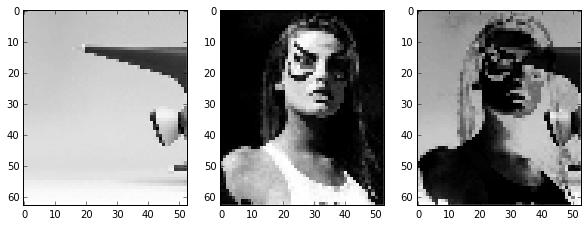

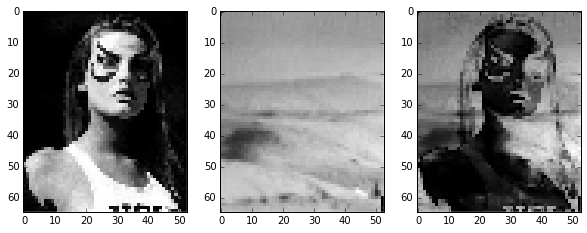

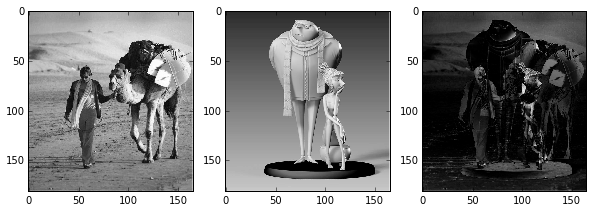

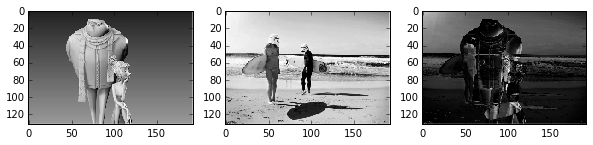

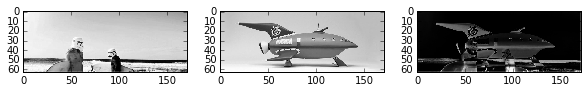

In [25]:
# Apply to image set
for i in range(len(imgset)):
    decimg_a = img_as_float(color.rgb2grey(decimate_image(imgset[i], 5))) # downsample to make it easier to see graphs
    decimg_b = img_as_float(color.rgb2grey(decimate_image(imgset[(i+1) % len(imgset)], 5)))
    a, b, d = find_pairwise_difference_squared(decimg_a, decimg_b)
    plt.figure()
    plt.subplot(1, 3, 1)
    plt.imshow(a)
    plt.subplot(1, 3, 2)
    plt.imshow(b)
    plt.subplot(1, 3, 3)
    plt.imshow(d)

## Feature Detection

### Sobel filter

In [26]:
 # Apply a Sobel filter to the image.
def apply_sobel(img):
    sobel_kernel = np.array([[-1, 0, +1],[-2, 0, +2],[-1, 0, +1]])
    Gx = convolve(img, sobel_kernel)
    Gy = convolve(img, -sobel_kernel.transpose())
    return np.sqrt(np.square(Gx) + np.square(Gy))

# This should do the same thing as skimage.filters.sobel(img)

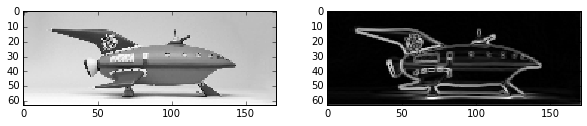

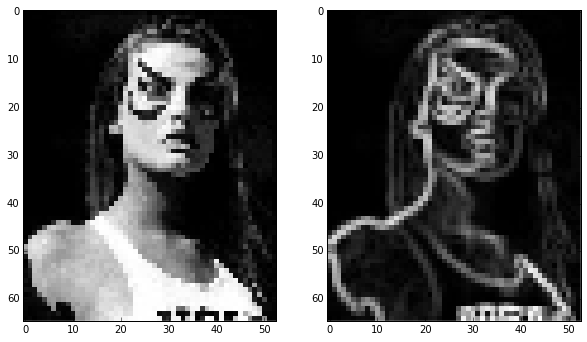

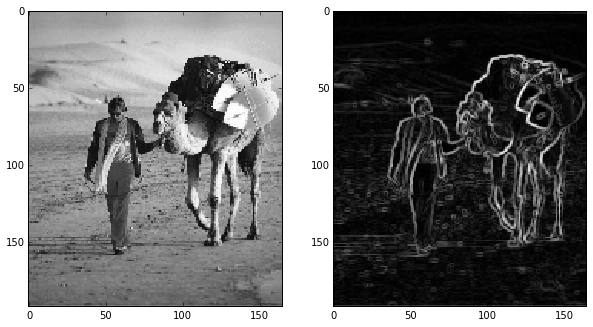

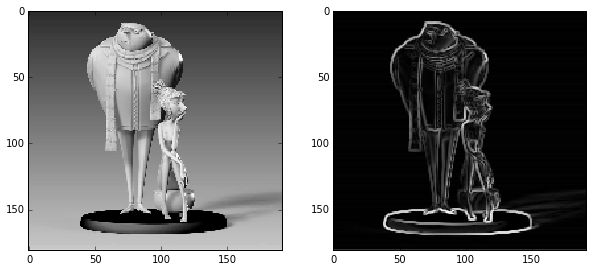

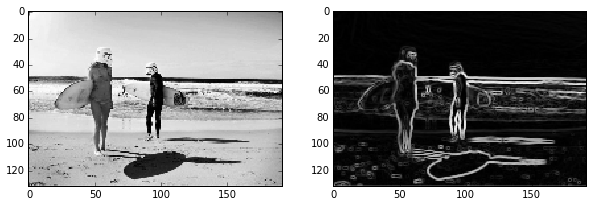

In [27]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(decimate_image(img, 5))) # downsample to make it easier to see graphs
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(apply_sobel(imgbw))

### Canny edge detector 

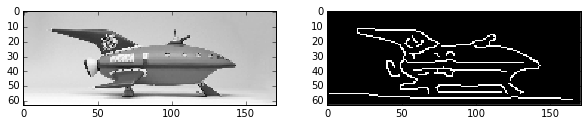

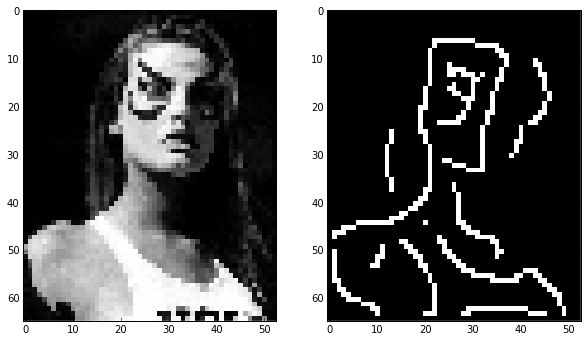

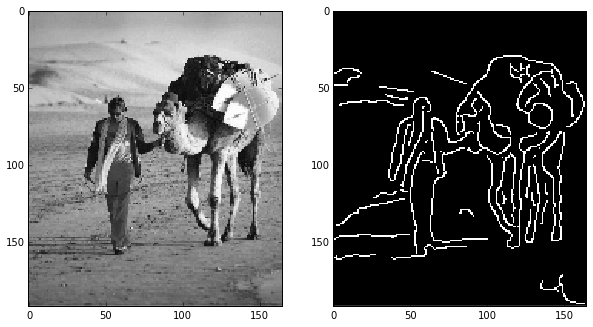

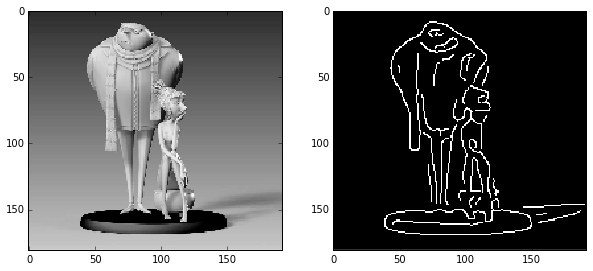

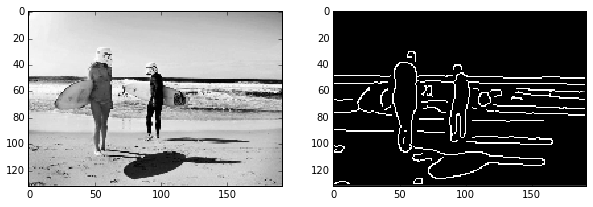

In [28]:
# Apply to image set
sigma = 2.0
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(decimate_image(img, 5))) # downsample to make it easier to see graphs
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(feature.canny(imgbw, sigma))

### Hough transforms

In [29]:
# Plot the circular Hough transforms of an image at the given radii.
def plot_circle_hough(img, radii, sigma):
    edges = feature.canny(img, sigma)
    hough = hough_circle(edges, radii)
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(edges)
    plt.figure()
    for j in range(len(hough)):
        if len(hough)==0: continue
        plt.subplot(1, len(hough), j)
        plt.imshow(hough[j,:,:])    

C:\Anaconda\lib\site-packages\matplotlib\axes\_subplots.py:69: MatplotlibDeprecationWarning: The use of 0 (which ends up being the _last_ sub-plot) is deprecated in 1.4 and will raise an error in 1.5
  mplDeprecation)


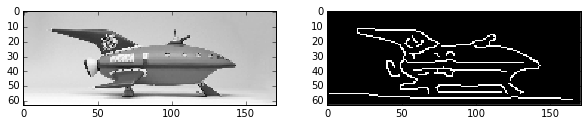

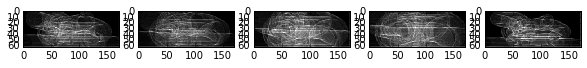

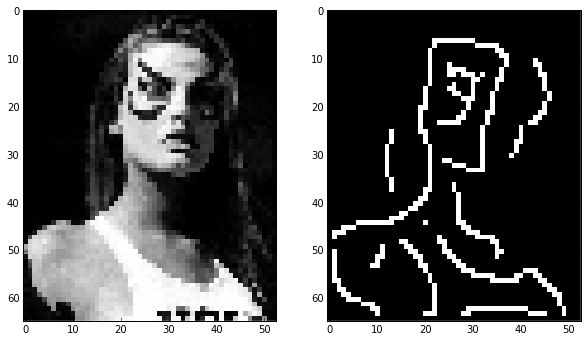

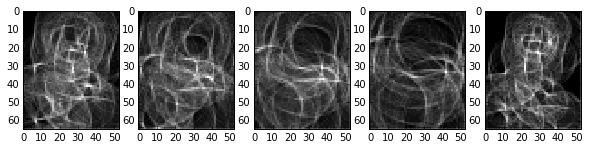

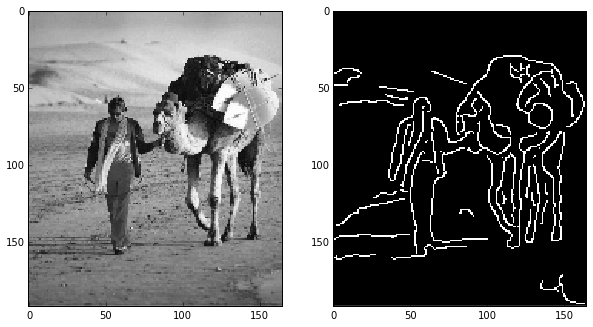

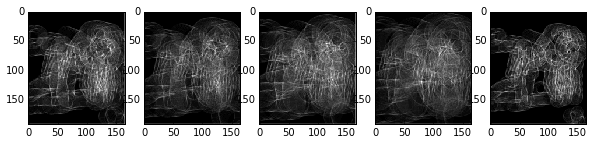

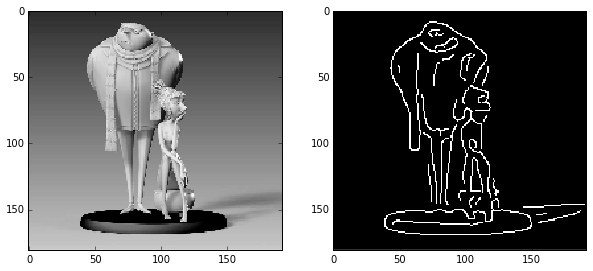

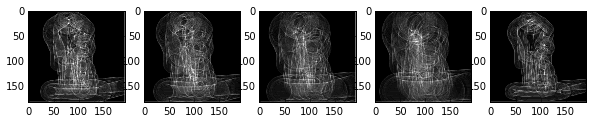

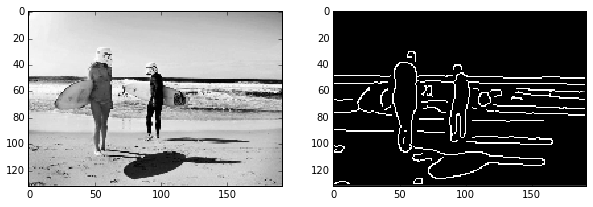

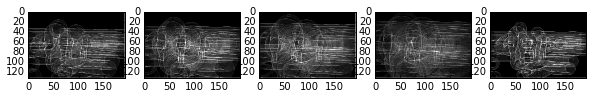

In [30]:
# Apply to image set
radii = np.arange(10, 35, 5)
sigma = 2.0
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(decimate_image(img, 5))) # downsample to make it easier to see graphs
    plot_circle_hough(imgbw, radii, sigma)

## Morphological Operations

### Morphological operations - de-noising

In [31]:
# Applies a morphological operator to remove noise
def morpho_denoise(img, shape, size):
    if shape == 'square':
        kernel = morphology.square(width=size)
    elif shape == 'diamond':
        kernel = morphology.diamond(radius=size)
    else:
        print("Shape must be 'square' or 'diamond'.")
        return None
    return morphology.opening(img, kernel)

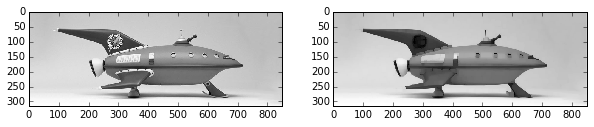

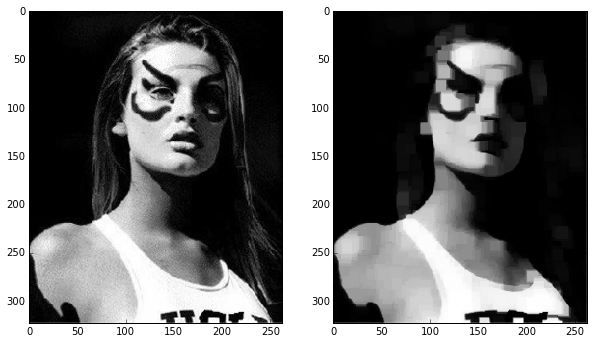

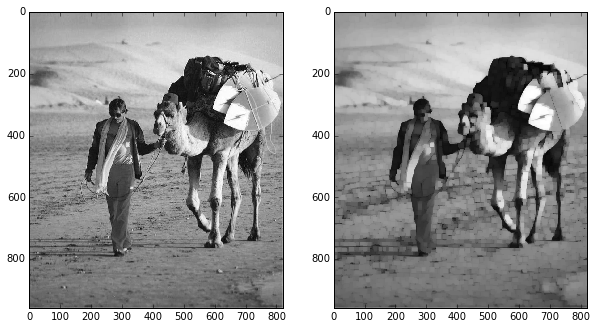

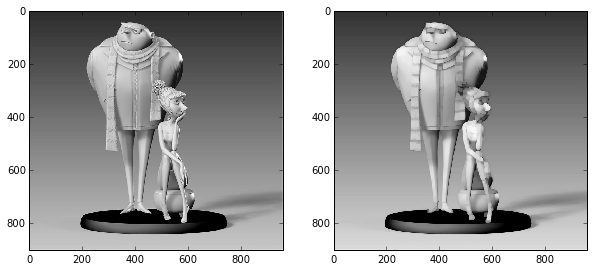

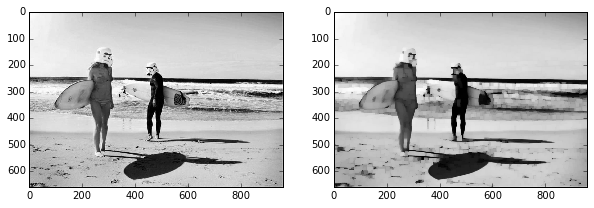

In [32]:
# Apply to image set
for i,img in enumerate(imgset):
    imgbw = img_as_float(color.rgb2grey(img))
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(imgbw)
    plt.subplot(1, 2, 2)
    plt.imshow(morpho_denoise(imgbw, 'square', 10))

## Segmentation

### SLIC (Simple Linear Iterative Clustering)

In [33]:
# Calculate the mean color of slic regions, from the SciKit tutorial
def mean_color(image, labels):
    out = np.zeros_like(image)
    for label in np.unique(labels):
        indices = np.nonzero(labels == label)
        out[indices] = np.mean(image[indices], axis=0)
    return out

def plot_slic_segmentation(img):
    labels = seg.slic(img, n_segments=24, compactness=70, sigma=2.0, enforce_connectivity=True)
    return mean_color(img, labels)

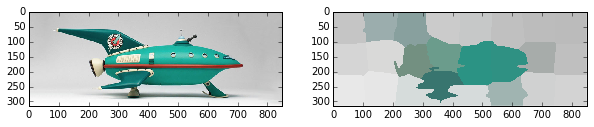

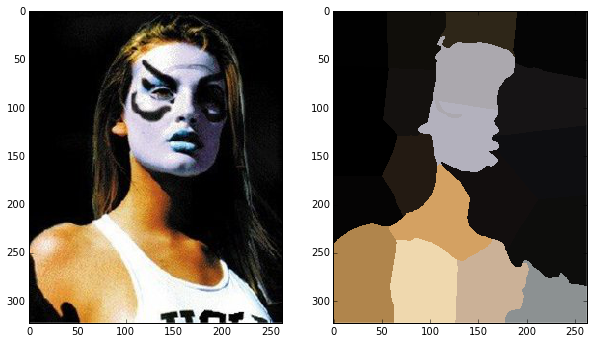

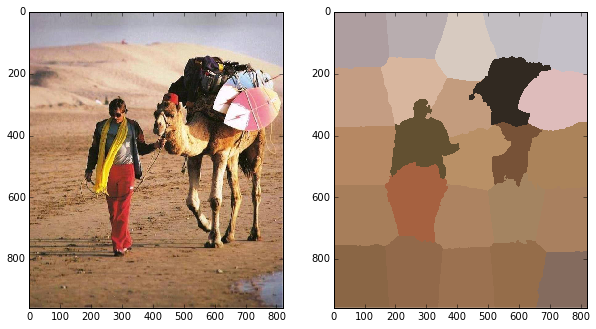

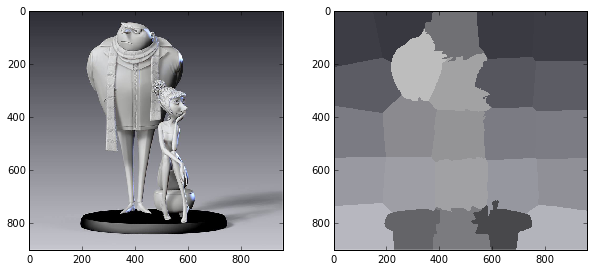

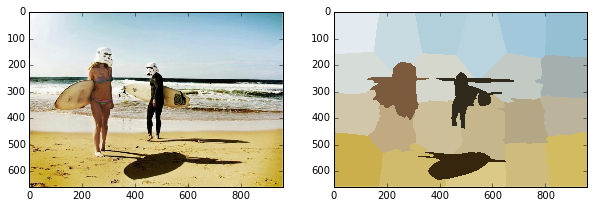

In [34]:
# Apply to the images
for i,img in enumerate(imgset):
    rgbimg = img_as_float(color.gray2rgb(img))
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.subplot(1, 2, 2)
    plt.imshow(plot_slic_segmentation(rgbimg))

### Watershed algorithm

In [35]:
# Show a watershed plot of an image
def plot_watershed(img, sigma):
    edges = feature.canny(img, sigma)
    distance_from_edge = nd.distance_transform_edt(-edges)
    peaks = peak_local_max(distance_from_edge)
    peaks_image = np.zeros(img.shape, np.bool)
    peaks_image[tuple(np.transpose(peaks))] = True
    seeds, num_seeds = nd.label(peaks_image)
    plt.plot(peaks[:, 1], peaks[:, 0], 'ro')
    ws = watershed(edges, seeds)
    plt.imshow(color.label2rgb(ws, img))

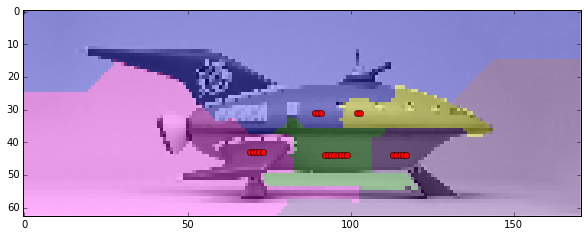

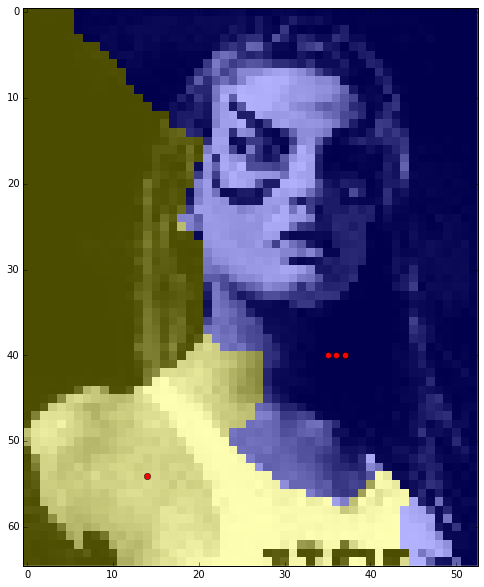

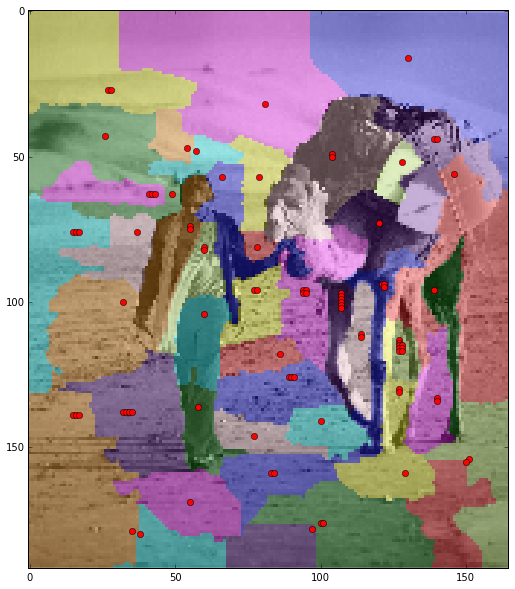

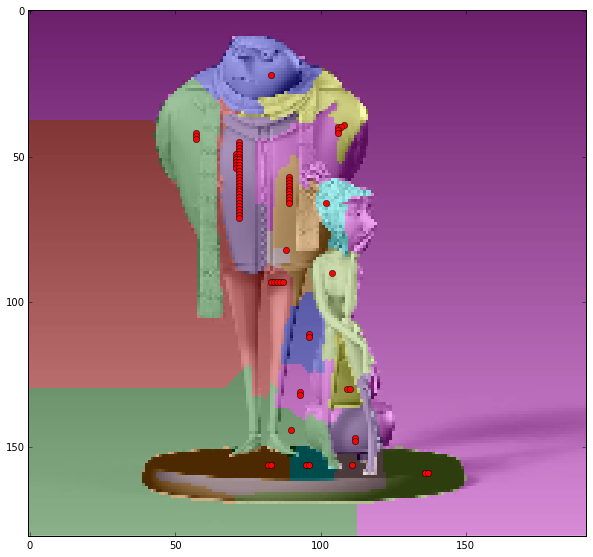

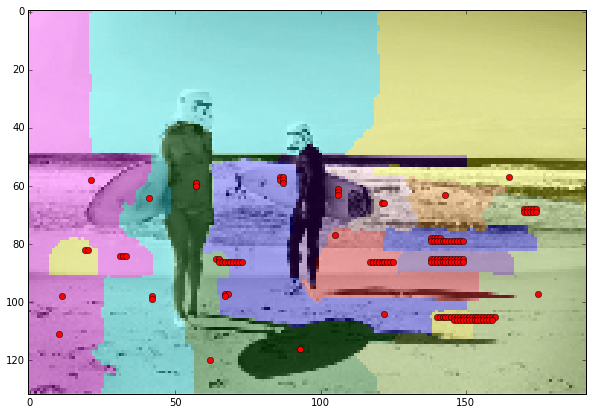

In [36]:
# Apply to the images
for i,img in enumerate(imgset):
    imgbw = (color.rgb2grey(decimate_image(img, 5)))
    plt.figure()
    plot_watershed(imgbw, 1.0)